In [1]:
from astropy.io import fits
import numpy as np
import matplotlib.pyplot as plt
import aplpy
from matplotlib import cm
from astropy.io import fits
import numpy as np
from matplotlib import pyplot as plt
import aplpy
from astropy.wcs import WCS
import astropy.units as u
from astropy.coordinates import SkyCoord
from astropy.coordinates import ICRS, Galactic, FK4, FK5
import warnings
warnings.simplefilter('ignore')
import fil_finder
from fil_finder import FilFinder2D, Filament2D
from astropy.io import fits
import tqdm
import copy
import random
from matplotlib.colors import rgb2hex
import pandas as pd
import math
from scipy.stats import moment
import spectral_cube
from spectral_cube.spectral_cube import SpectralCube
import cv2
import skimage
#from PIL import Image
from scipy.ndimage import gaussian_filter
from glob import glob
import os
import pickle
from scipy.optimize import curve_fit
import re
import subprocess

In [2]:
def dataloader(v_start, v_end, center):
    with open("/home/filament/Documents/wcs/wcs_%s_%s_south_CRVAL%s.fits.pkl"%(v_start, v_end, center-5), "rb") as ff:
        w_right = pickle.load(ff)
    with open("/home/filament/Documents/wcs/wcs_%s_%s_south_CRVAL%s.fits.pkl"%(v_start, v_end, center+5), "rb") as ff:
        w_left = pickle.load(ff)
    # with open("/home/filament/Documents/wcs/wcs_-60_-20_north_CRVAL15.fits.pkl", "rb") as ff:
    #     w_center = pickle.load(ff)

    with open("/home/filament/Documents/wcs/filament_%s_%s_south_CRVAL%s.fits.pkl"%(v_start, v_end, center-5), "rb") as ff:
        fil_right = pickle.load(ff)
    with open("/home/filament/Documents/wcs/filament_%s_%s_south_CRVAL%s.fits.pkl"%(v_start, v_end, center+5), "rb") as ff:
        fil_left = pickle.load(ff)   
    # with open("/home/filament/Documents/wcs/filament_-60_-20_north_CRVAL15.fits.pkl", "rb") as ff:
    #     fil_center = pickle.load(ff)
    fil_right_ = copy.deepcopy(fil_right)
    fil_left_ = copy.deepcopy(fil_left)
    
    fil_left.filaments = [ff for ff in fil_left.filaments \
                 if (center+10 >= w_left.wcs_pix2world(ff.position()[1].value,ff.position()[0].value,0)[0] >= center)\
                 & (-5 >= w_left.wcs_pix2world(ff.position()[1].value,ff.position()[0].value,0)[1] >= -60)]

    fil_right.filaments = [ff for ff in fil_right.filaments \
                 if (center >= w_right.wcs_pix2world(ff.position()[1].value,ff.position()[0].value,0)[0] >= center-10)\
                 & (-5 >= w_right.wcs_pix2world(ff.position()[1].value,ff.position()[0].value,0)[1] >= -60)]

    fil_left_.filaments = [ff for ff in fil_left_.filaments \
                 if (center+10 >= w_left.wcs_pix2world(ff.position()[1].value,ff.position()[0].value,0)[0] >= center-10)\
                 & (-5 >= w_left.wcs_pix2world(ff.position()[1].value,ff.position()[0].value,0)[1] >= -60)]

    fil_right_.filaments = [ff for ff in fil_right_.filaments \
                 if (center+10 >= w_right.wcs_pix2world(ff.position()[1].value,ff.position()[0].value,0)[0] >= center-10)\
                 & (-5 >= w_right.wcs_pix2world(ff.position()[1].value,ff.position()[0].value,0)[1] >= -60)]
    
    fits_list = glob("/home/filament/Documents/size_decision/fits/%s_%s_south_CRVAL%s.fits"%(v_start, v_end, center))
    fits_name = [fits_list[0].split("/")[6]][0]
    ii_hdu = fits.open(fits_list[0])[0]
                            
    return ii_hdu, fits_name, fil_right, fil_left, w_right, w_left, fil_right_, fil_left_


left center right

In [3]:
with open("/home/filament/Documents/wcs/wcs_-60_-20_south_CRVAL145.fits.pkl", "rb") as ff:
    w_right = pickle.load(ff)
with open("/home/filament/Documents/wcs/wcs_-60_-20_south_CRVAL155.fits.pkl", "rb") as ff:
    w_left = pickle.load(ff)
# with open("/home/filament/Documents/wcs/wcs_-60_-20_north_CRVAL15.fits.pkl", "rb") as ff:
#     w_center = pickle.load(ff)

with open("/home/filament/Documents/wcs/filament_-60_-20_south_CRVAL145.fits.pkl", "rb") as ff:
    fil_right = pickle.load(ff)
with open("/home/filament/Documents/wcs/filament_-60_-20_south_CRVAL155.fits.pkl", "rb") as ff:
    fil_left = pickle.load(ff)   
# with open("/home/filament/Documents/wcs/filament_-60_-20_north_CRVAL15.fits.pkl", "rb") as ff:
#     fil_center = pickle.load(ff)
fil_right_ = copy.deepcopy(fil_right)
fil_left_ = copy.deepcopy(fil_left)

In [4]:
fil_left.filaments = [ff for ff in fil_left.filaments \
                 if (160 >= w_left.wcs_pix2world(ff.position()[1].value,ff.position()[0].value,0)[0] >= 150)\
                 & (-5 >= w_left.wcs_pix2world(ff.position()[1].value,ff.position()[0].value,0)[1] >= -60)]

fil_right.filaments = [ff for ff in fil_right.filaments \
                 if (150 >= w_right.wcs_pix2world(ff.position()[1].value,ff.position()[0].value,0)[0] >= 140)\
                 & (-5 >= w_right.wcs_pix2world(ff.position()[1].value,ff.position()[0].value,0)[1] >= -60)]

# fil_center.filaments = [ff for ff in fil_center.filaments \
#                  if (40 >= w_center.wcs_pix2world(ff.position()[1].value,ff.position()[0].value,0)[0] >= 0)\
#                  & (60 >= w_center.wcs_pix2world(ff.position()[1].value,ff.position()[0].value,0)[1] >= 5)]

fil_left_.filaments = [ff for ff in fil_left_.filaments \
                 if (160 >= w_left.wcs_pix2world(ff.position()[1].value,ff.position()[0].value,0)[0] >= 140)\
                 & (-5 >= w_left.wcs_pix2world(ff.position()[1].value,ff.position()[0].value,0)[1] >= -60)]

fil_right_.filaments = [ff for ff in fil_right_.filaments \
                 if (160 >= w_right.wcs_pix2world(ff.position()[1].value,ff.position()[0].value,0)[0] >= 140)\
                 & (-5 >= w_right.wcs_pix2world(ff.position()[1].value,ff.position()[0].value,0)[1] >= -60)]

In [5]:
# fpath = glob("/home/filament/Documents/size_decision/-60_-20_north_ZEA3.fits")
fits_list = glob("/home/filament/Documents/size_decision/fits/-60_-20_south_CRVAL150.fits")
fits_name = [fits_list[0].split("/")[6]][0]
ii_hdu = fits.open(fits_list[0])[0]

# ii_hdu.data[:,:] = np.nan

In [6]:
def check(**kwargs):
    print(kwargs)

In [7]:
check(right_number=5)

{'right_number': 5}


In [403]:
class Make_Catalog():
    def __init__(self, fil_right, fil_left, w_right, w_left, fil_right_, fil_left_,fits_name):
        self.fil_right = fil_right
        self.fil_left = fil_left
        self.w_right = w_right
        self.w_left = w_left
        self.fil_right_ = fil_right_
        self.fil_left_ = fil_left_
        self.fits_name = fits_name
        
        C = 1.82*(10**(18))
        D = 1000*u.pc ##!!!!!!!!!!!!    hyper parameter!!
        # S = ((((2*math.pi)/360)*0.083)*D***2
        S = ((D*np.tan(np.deg2rad(0.083))).to(u.cm).value)**2

        proton = 1.67*(10**(-27))
        atom_weight = 1.00794
        solar = 1.989*(10**(30))

        self.mass_factor = C*S*proton*atom_weight/solar
        
#     def del_filament(self, fil_right, fil_left, right_number=None, left_number=None):
#         alt_fil_right = copy.deepcopy(fil_right)
#         alt_fil_left = copy.deepcopy(fil_left)
        
#         del_ls_right = copy.deepcopy(right_number)
#         del_ls_left = copy.deepcopy(left_number)
#         if right_number != None:
#             del alt_fil_right.filaments[right_number]
            
#         if left_number != None:
#             del alt_fil_left.filaments[left_number]
            
#         return alt_fil_right,alt_fil_left

        
        ###################
#         new_del_ls=copy.deepcopy(del_ls)
#         for i,j in enumerate(del_ls):
#             if i==0:
#                 pass
#             count=0
#             for num in range(0,i):
#                 if del_ls[i]>del_ls[num]:
#                     count+=1
#             new_del_ls[i] = del_ls[i]-count
    ##############################
    def del_filament(self, fil_right, fil_left, right_number=None, left_number=None):
        if (type(fil_right)!=dict) and (type(fil_left)!=dict):
            alt_fil_right = copy.deepcopy(fil_right)
            alt_fil_left = copy.deepcopy(fil_left)

            left_number = [i - len(self.fil_right.filaments) for i in left_number]
            del_ls_right = copy.deepcopy(right_number)
            del_ls_left = copy.deepcopy(left_number)
            if right_number != None:
                for i,j in enumerate(right_number):
                    if i==0:
                        pass
                    count=0
                    for num in range(0,i):
                        if right_number[i]>right_number[num]:
                            count+=1
                    del_ls_right[i] = right_number[i]-count

                for z in del_ls_right:
                    del alt_fil_right.filaments[z]

            if left_number != None:
                for i,j in enumerate(left_number):
                    if i==0:
                        pass
                    count=0
                    for num in range(0,i):
                        if left_number[i]>left_number[num]:
                            count+=1
                    del_ls_left[i] = left_number[i]-count

                for z in del_ls_left:
                    del alt_fil_left.filaments[z]
                    
            return alt_fil_right,alt_fil_left
        elif (type(fil_right)==dict) and (type(fil_left)==dict):
            alt_fil_right = copy.deepcopy(fil_right)
            alt_fil_left = copy.deepcopy(fil_left)

            left_number = [i - len(fil_right["fil_object"]) for i in left_number]
            del_ls_right = copy.deepcopy(right_number)
            del_ls_left = copy.deepcopy(left_number)
            if right_number != None:
                for i,j in enumerate(right_number):
                    if i==0:
                        pass
                    count=0
                    for num in range(0,i):
                        if right_number[i]>right_number[num]:
                            count+=1
                    del_ls_right[i] = right_number[i]-count

                for z in del_ls_right:
                    del alt_fil_right["fil_object"][z]
                    del alt_fil_right["wcs"][z]
                    

            if left_number != None:
                for i,j in enumerate(left_number):
                    if i==0:
                        pass
                    count=0
                    for num in range(0,i):
                        if left_number[i]>left_number[num]:
                            count+=1
                    del_ls_left[i] = left_number[i]-count

                for z in del_ls_left:
                    del alt_fil_left["fil_object"][z]
                    del alt_fil_left["wcs"][z]
                    
            return alt_fil_right,alt_fil_left

    
    def add_filament(self,fil_right, fil_left, fil_right_, fil_left_, right_number=None, left_number=None):
        alt_fil_right = copy.deepcopy(fil_right)
        alt_fil_left = copy.deepcopy(fil_left)
        
        alt_fil_right_ = copy.deepcopy(fil_right_)
        alt_fil_left_ = copy.deepcopy(fil_left_)
        
        if right_number != None:
            for right in right_number:   
                alt_fil_right.filaments.append(alt_fil_right_.filaments[right])
            
        if left_number != None:
            for left in left_number:
                alt_fil_left.filaments.append(alt_fil_left_.filaments[left])
        return alt_fil_right,alt_fil_left
        
        
    def make_total_fil(self, fil_right_obj=False, fil_left_obj=False,w_right=False,w_left=False):
        if (type(fil_right_obj)!=dict) and (type(fil_left_obj)!=dict):
            if (w_right == False) and (w_left==False):
                total_fil = []
                if (fil_right_obj and fil_left_obj):
                    total_fil += fil_right_obj.filaments
                    total_fil += fil_left_obj.filaments
                    return total_fil

                elif (fil_right_obj and (fil_left_obj==False)):
                    total_fil += fil_right_obj.filaments
                    return total_fil

                elif (fil_left_obj and (fil_right_obj==False)):
                    total_fil += fil_left_obj.filaments
                    return total_fil
            elif w_right and w_left:           
                if (fil_right_obj and fil_left_obj):
                    total_fil = {}
                    total_fil["fil_object"] = []
                    total_fil["wcs"] = []
                    total_fil["fil_object"] += fil_right_obj.filaments
                    total_fil["fil_object"] += fil_left_obj.filaments

                    for i in range(len(fil_right_obj.filaments)):
                        total_fil["wcs"].append(w_right)
                    for j in range(len(fil_left_obj.filaments)):
                        total_fil["wcs"].append(w_left)

                    return total_fil
        
        elif (type(fil_right_obj)==dict) and (type(fil_left_obj)==dict):
            total_fil = {}
            total_fil["fil_object"] = []
            total_fil["wcs"] = []
            total_fil["fil_object"] += fil_right_obj["fil_object"]
            total_fil["fil_object"] += fil_left_obj["fil_object"]
            total_fil["wcs"] += fil_right_obj["wcs"]
            total_fil["wcs"] += fil_left_obj["wcs"]
            
            return total_fil

            


    
    def make_PA(self, ii_hdu, fits_name, total_fil):
        lean_map = np.zeros_like(ii_hdu.data)
        w = WCS(ii_hdu)
        x_ch_array = np.arange(ii_hdu.data.shape[1])
        y_ch_array = np.arange(ii_hdu.data.shape[0])
        X, Y = np.meshgrid(x_ch_array, y_ch_array)
        pos_wcs = w.wcs_pix2world(X, Y, 0)
        pos_pix_p = w.wcs_world2pix(pos_wcs[0], pos_wcs[1]+0.00001, 0)
        pos_pix_m = w.wcs_world2pix(pos_wcs[0], pos_wcs[1]-0.00001, 0)
        ratio_map = -(pos_pix_p[0] - pos_pix_m[0])/(pos_pix_p[1] - pos_pix_m[1])
        lean_map = np.rad2deg(np.arctan(ratio_map))
        fig,ax = plt.subplots(1,1, figsize = (8,8))
        ax.imshow(lean_map, origin="lower", cmap="jet", vmin=-90, vmax=90)
        ax.set_title(str(lean_map.shape))

        plt.clf()
        fig = aplpy.FITSFigure(ii_hdu,slices=[0])
        plt.imshow(lean_map)
        fig.add_grid()
        plt.colorbar()
        fig.ticks.set_xspacing(5)
        fig.ticks.set_yspacing(5)
        plt.show()
        ori_dict = {}
#         glon_dict = {}
#         glat_dict = {}
        fil_num = 0
        fil_number_list = []
        ori_list = []
#         glon_list = []
#         glat_list = []
        skel_ori_list = []

        for fil_tempo in tqdm.tqdm(total_fil):
            fil_tempo.rht_analysis()
            y_pos,x_pos = fil_tempo.position()
            y_pos,x_pos = y_pos.value,x_pos.value
            y_pos,x_pos = int(np.round(y_pos)),int(np.round(x_pos))
            skel_ori_list.append(np.rad2deg(fil_tempo.orientation.value) - lean_map[int(y_pos), int(x_pos)])
            y_start, x_start = fil_tempo.pixel_extents[0][0], fil_tempo.pixel_extents[0][1]
            fil_tempo.rht_branch_analysis()
            ori_branches_tempo = np.rad2deg(fil_tempo.orientation.value)
            ori_list.append(ori_branches_tempo - lean_map[y_pos, x_pos])
        ori_array = np.array(ori_list)
        ori_array = np.where(ori_array>90, ori_array-180, ori_array)
        ori_array = np.where(ori_array<-90, ori_array+180, ori_array)
        ori_dict[fits_name] = ori_array
        plt.figure(figsize =(10,10))
        plt.hist(ori_dict[fits_name], bins=np.linspace(-90, 90, num=19))
        plt.xticks(fontsize=30)
        plt.yticks(fontsize=30)
        
        self.ori_dict = ori_dict
        
        return ori_dict
    
    
        
        
        
    def make_fil_table(self,total_fil ,fits_name ,key = None):
        if type(total_fil)==dict:
            df = pd.DataFrame([np.format_float_scientific(i.total_intensity().value, precision = 2 ,exp_digits=2) for i in total_fil["fil_object"]],columns=["T Kkm/s"],\
            index = ["filament %s" %(j) for j in range(len(total_fil["fil_object"]))])
            df["M Msolar"] = [np.format_float_scientific(i.total_intensity().value*self.mass_factor, precision = 2 ,exp_digits=2) for i in total_fil["fil_object"]]
            df["orientation [deg]"] = [np.round(i,2) for i in self.ori_dict[fits_name]]
            df["length [pix]"] = [np.round(i.length().value,2) for i in total_fil["fil_object"]]
            df["width [pix]"] = [np.round(i.radprof_fwhm()[0].value,2) for i in total_fil["fil_object"]]
#                 df.to_csv("/home/filament/Documents/csv/%s_"%(fits_name)+".csv")
            return df
            
        elif type(total_fil)!=dict:
            if key == "right":
                df = pd.DataFrame([np.format_float_scientific(i.total_intensity().value, precision = 2 ,exp_digits=2) for i in total_fil],columns=["T Kkm/s"],\
                index = ["filament %s" %(j) for j in range(len(total_fil))])
                df["M Msolar"] = [np.format_float_scientific(i.total_intensity().value*self.mass_factor, precision = 2 ,exp_digits=2) for i in total_fil]
                df["orientation [deg]"] = [np.round(i,2) for i in self.ori_dict[fits_name]]
                df["length [pix]"] = [np.round(i.length().value,2) for i in total_fil]
                df["width [pix]"] = [np.round(i.radprof_fwhm()[0].value,2) for i in total_fil]
                df.to_csv("/home/filament/Documents/csv/%s_right"%(fits_name)+".csv")
                return df

            elif key == "left":
                df = pd.DataFrame([np.format_float_scientific(i.total_intensity().value, precision = 2 ,exp_digits=2) for i in total_fil],columns=["T Kkm/s"],\
                index = ["filament %s" %(j) for j in range(len(total_fil))])
                df["M Msolar"] = [np.format_float_scientific(i.total_intensity().value*self.mass_factor, precision = 2 ,exp_digits=2) for i in total_fil]
                df["orientation [deg]"] = [np.round(i,2) for i in self.ori_dict[fits_name]]
                df["length [pix]"] = [np.round(i.length().value,2) for i in total_fil]
                df["width [pix]"] = [np.round(i.radprof_fwhm()[0].value,2) for i in total_fil]
                df.to_csv("/home/filament/Documents/csv/%s_left"%(fits_name)+".csv")
                return df

            elif key == "prototype":
                df = pd.DataFrame([np.format_float_scientific(i.total_intensity().value, precision = 2 ,exp_digits=2) for i in total_fil],columns=["T Kkm/s"],\
                index = ["filament %s" %(j) for j in range(len(total_fil))])
                df["M Msolar"] = [np.format_float_scientific(i.total_intensity().value*self.mass_factor, precision = 2 ,exp_digits=2) for i in total_fil]
                df["orientation [deg]"] = [np.round(i,2) for i in self.ori_dict[fits_name]]
                df["length [pix]"] = [np.round(i.length().value,2) for i in total_fil]
                df["width [pix]"] = [np.round(i.radprof_fwhm()[0].value,2) for i in total_fil]
                df.to_csv("/home/filament/Documents/csv/%s_prototype"%(fits_name)+".csv")
                return df

            elif key == "finished":
                df = pd.DataFrame([np.format_float_scientific(i.total_intensity().value, precision = 2 ,exp_digits=2) for i in total_fil],columns=["T Kkm/s"],\
                index = ["filament %s" %(j) for j in range(len(total_fil))])
                df["M Msolar"] = [np.format_float_scientific(i.total_intensity().value*self.mass_factor, precision = 2 ,exp_digits=2) for i in total_fil]
                df["orientation [deg]"] = [np.round(i,2) for i in self.ori_dict[fits_name]]
                df["length [pix]"] = [np.round(i.length().value,2) for i in total_fil]
                df["width [pix]"] = [np.round(i.radprof_fwhm()[0].value,2) for i in total_fil]
                df.to_csv("/home/filament/Documents/csv/%s_finished"%(fits_name)+".csv")
                return df

            else:
                df = pd.DataFrame([np.format_float_scientific(i.total_intensity().value, precision = 2 ,exp_digits=2) for i in total_fil],columns=["T Kkm/s"],\
                index = ["filament %s" %(j) for j in range(len(total_fil))])
                df["M Msolar"] = [np.format_float_scientific(i.total_intensity().value*self.mass_factor, precision = 2 ,exp_digits=2) for i in total_fil]
                df["orientation [deg]"] = [np.round(i,2) for i in self.ori_dict[fits_name]]
                df["length [pix]"] = [np.round(i.length().value,2) for i in total_fil]
                df["width [pix]"] = [np.round(i.radprof_fwhm()[0].value,2) for i in total_fil]
                return df
        
    def save_object(self,fil_right_obj, fil_left_obj, total_fil_obj, fits_name=fits_name):
        with open("/home/filament/Documents/fil_object/fil_right/fil_right_%s.pkl"%(fits_name), "wb") as ff:
            pickle.dump(fil_right_obj, ff)
        with open("/home/filament/Documents/fil_object/fil_left/fil_left_%s.pkl"%(fits_name), "wb") as ff:
            pickle.dump(fil_left_obj, ff)
        with open("/home/filament/Documents/fil_object/total_fil/total_fil_%s.pkl"%(fits_name), "wb") as ff:
            pickle.dump(total_fil_obj, ff)
        

    
    def fil_mapping(self, ii_hdu,fits_name, fil_right_obj = False, fil_left_obj = False, total_fil_obj=False, key=False\
                   ,w_right=False,w_left=False):
        
        w = WCS(ii_hdu)

        fig = plt.figure(figsize=(32, 32))
        f = aplpy.FITSFigure(ii_hdu, slices=[0], figure=fig)
        f.show_colorscale(vmin = 0.5, vmax = 50, stretch="log", cmap="Greys")
        f.add_colorbar()
        f.colorbar.show()
        f.colorbar.set_width(0.2)
        f.colorbar.set_ticks([0.5, 1, 5, 10, 20, 30, 40, 50])
        f.colorbar.set_font(size=35, family='serif')
        f.colorbar.set_axis_label_text("K km/s")
        f.colorbar.set_axis_label_font(size=35, family='serif')

        cmap = plt.get_cmap("gist_rainbow")
        #         d = copy.deepcopy(data0)
        pos_x_wcs_list = []
        pos_y_wcs_list = []
        color_tempo_list = []
        y_start0_list = []
        x_start0_list = []
        
        if fil_right_obj and (type(fil_right_obj)!=dict):
        #fil_right
            pos_x_wcs_list_right = []
            pos_y_wcs_list_right = []
            for fil_tempo in tqdm.tqdm(fil_right_obj.filaments):
                w = self.w_right
                if w_right:
                    w = w_right
                y_start, x_start = fil_tempo.pixel_extents[0][0], fil_tempo.pixel_extents[0][1]
                fil_tempo.rht_branch_analysis()
                ori_branches_tempo = np.rad2deg(fil_tempo.orientation_branches.value)
                for i in range(len(fil_tempo.branch_pts())):
                    pixels_tempo = fil_tempo.branch_properties["pixels"][i]
                    y_pix_all = pixels_tempo[:,0]
                    x_pix_all = pixels_tempo[:,1]
                    pos_x_tempo = int(np.nanmax(x_pix_all)/2-np.nanmin(x_pix_all)/2)+np.nanmin(x_pix_all)+x_start
                    pos_y_tempo = int(np.nanmax(y_pix_all)/2-np.nanmin(y_pix_all)/2)+np.nanmin(y_pix_all)+y_start
                    ori_branch_tempo = ori_branches_tempo[i]
                    pos_x_wcs_tempo, pos_y_wcs_tempo = w.wcs_pix2world(pos_x_tempo, pos_y_tempo, 0)
                    pos_x_wcs_array, pos_y_wcs_array = w.wcs_pix2world(x_pix_all+x_start, y_pix_all+y_start, 0)
                    color_tempo_list += ["#%06x" % random.randint(0, 0xFFFFFF)]*len(pos_x_wcs_array)
                    pos_x_wcs_list_right += list(pos_x_wcs_array)
                    pos_y_wcs_list_right += list(pos_y_wcs_array)
            #         f.show_markers(pos_x_wcs_list, pos_y_wcs_list, marker="s", s=3, facecolor=color_tempo_list, edgecolor="none", zorder=11)

                y_start0_list.append(pos_y_wcs_array[0])
                x_start0_list.append(pos_x_wcs_array[0])
            f.show_markers(pos_x_wcs_list_right, pos_y_wcs_list_right, marker="s", s=100, facecolor="blue",edgecolor="none", zorder=11)

            
        if fil_right_obj and (type(fil_right_obj)==dict):
        #fil_right
            pos_x_wcs_list_right = []
            pos_y_wcs_list_right = []
            for num,fil_tempo in enumerate(tqdm.tqdm(fil_right_obj["fil_object"])):
                w = fil_right_obj["wcs"][num]
                y_start, x_start = fil_tempo.pixel_extents[0][0], fil_tempo.pixel_extents[0][1]
                fil_tempo.rht_branch_analysis()
                ori_branches_tempo = np.rad2deg(fil_tempo.orientation_branches.value)
                for i in range(len(fil_tempo.branch_pts())):
                    pixels_tempo = fil_tempo.branch_properties["pixels"][i]
                    y_pix_all = pixels_tempo[:,0]
                    x_pix_all = pixels_tempo[:,1]
                    pos_x_tempo = int(np.nanmax(x_pix_all)/2-np.nanmin(x_pix_all)/2)+np.nanmin(x_pix_all)+x_start
                    pos_y_tempo = int(np.nanmax(y_pix_all)/2-np.nanmin(y_pix_all)/2)+np.nanmin(y_pix_all)+y_start
                    ori_branch_tempo = ori_branches_tempo[i]
                    pos_x_wcs_tempo, pos_y_wcs_tempo = w.wcs_pix2world(pos_x_tempo, pos_y_tempo, 0)
                    pos_x_wcs_array, pos_y_wcs_array = w.wcs_pix2world(x_pix_all+x_start, y_pix_all+y_start, 0)
                    color_tempo_list += ["#%06x" % random.randint(0, 0xFFFFFF)]*len(pos_x_wcs_array)
                    pos_x_wcs_list_right += list(pos_x_wcs_array)
                    pos_y_wcs_list_right += list(pos_y_wcs_array)
            #         f.show_markers(pos_x_wcs_list, pos_y_wcs_list, marker="s", s=3, facecolor=color_tempo_list, edgecolor="none", zorder=11)

                y_start0_list.append(pos_y_wcs_array[0])
                x_start0_list.append(pos_x_wcs_array[0])
            f.show_markers(pos_x_wcs_list_right, pos_y_wcs_list_right, marker="s", s=100, facecolor="blue",edgecolor="none", zorder=11)


        if fil_left_obj and (type(fil_left_obj)!=dict):
        #fil_left
            pos_x_wcs_list_left = []
            pos_y_wcs_list_left = []

            for fil_tempo in tqdm.tqdm(fil_left_obj.filaments):
                w = self.w_left
                if w_left:
                    w = w_left
                y_start, x_start = fil_tempo.pixel_extents[0][0], fil_tempo.pixel_extents[0][1]

                fil_tempo.rht_branch_analysis()
                ori_branches_tempo = np.rad2deg(fil_tempo.orientation_branches.value)
            #         print("ori_branches_tempo",ori_branches_tempo)
                for i in range(len(fil_tempo.branch_pts())):
                    pixels_tempo = fil_tempo.branch_properties["pixels"][i]
                    y_pix_all = pixels_tempo[:,0]
                    x_pix_all = pixels_tempo[:,1]
                    pos_x_tempo = int(np.nanmax(x_pix_all)/2-np.nanmin(x_pix_all)/2)+np.nanmin(x_pix_all)+x_start
                    pos_y_tempo = int(np.nanmax(y_pix_all)/2-np.nanmin(y_pix_all)/2)+np.nanmin(y_pix_all)+y_start
                    ori_branch_tempo = ori_branches_tempo[i]
                    pos_x_wcs_tempo, pos_y_wcs_tempo = w.wcs_pix2world(pos_x_tempo, pos_y_tempo, 0)
                    pos_x_wcs_array, pos_y_wcs_array = w.wcs_pix2world(x_pix_all+x_start, y_pix_all+y_start, 0)
                    color_tempo_list += ["#%06x" % random.randint(0, 0xFFFFFF)]*len(pos_x_wcs_array)
                    pos_x_wcs_list_left += list(pos_x_wcs_array)
                    pos_y_wcs_list_left += list(pos_y_wcs_array)
                y_start0_list.append(pos_y_wcs_array[int(len(pos_y_wcs_array)/2)])
                x_start0_list.append(pos_x_wcs_array[int(len(pos_x_wcs_array)/2)])
            f.show_markers(pos_x_wcs_list_left, pos_y_wcs_list_left, marker="s", s=40, facecolor="green",edgecolor="none", zorder=11)

        if fil_left_obj and (type(fil_left_obj)==dict):
        #fil_left
            pos_x_wcs_list_left = []
            pos_y_wcs_list_left = []

            for num,fil_tempo in enumerate(tqdm.tqdm(fil_left_obj["fil_object"])):
                w = fil_left_obj["wcs"][num]
                y_start, x_start = fil_tempo.pixel_extents[0][0], fil_tempo.pixel_extents[0][1]

                fil_tempo.rht_branch_analysis()
                ori_branches_tempo = np.rad2deg(fil_tempo.orientation_branches.value)
            #         print("ori_branches_tempo",ori_branches_tempo)
                for i in range(len(fil_tempo.branch_pts())):
                    pixels_tempo = fil_tempo.branch_properties["pixels"][i]
                    y_pix_all = pixels_tempo[:,0]
                    x_pix_all = pixels_tempo[:,1]
                    pos_x_tempo = int(np.nanmax(x_pix_all)/2-np.nanmin(x_pix_all)/2)+np.nanmin(x_pix_all)+x_start
                    pos_y_tempo = int(np.nanmax(y_pix_all)/2-np.nanmin(y_pix_all)/2)+np.nanmin(y_pix_all)+y_start
                    ori_branch_tempo = ori_branches_tempo[i]
                    pos_x_wcs_tempo, pos_y_wcs_tempo = w.wcs_pix2world(pos_x_tempo, pos_y_tempo, 0)
                    pos_x_wcs_array, pos_y_wcs_array = w.wcs_pix2world(x_pix_all+x_start, y_pix_all+y_start, 0)
                    color_tempo_list += ["#%06x" % random.randint(0, 0xFFFFFF)]*len(pos_x_wcs_array)
                    pos_x_wcs_list_left += list(pos_x_wcs_array)
                    pos_y_wcs_list_left += list(pos_y_wcs_array)
                y_start0_list.append(pos_y_wcs_array[int(len(pos_y_wcs_array)/2)])
                x_start0_list.append(pos_x_wcs_array[int(len(pos_x_wcs_array)/2)])
            f.show_markers(pos_x_wcs_list_left, pos_y_wcs_list_left, marker="s", s=40, facecolor="green",edgecolor="none", zorder=11)

        

        if total_fil_obj:
        #fil_left
            pos_x_wcs_list_total = []
            pos_y_wcs_list_total = []

            for num, fil_tempo in enumerate(tqdm.tqdm(total_fil_obj["fil_object"])):
                w = total_fil_obj["wcs"][num]
                y_start, x_start = fil_tempo.pixel_extents[0][0], fil_tempo.pixel_extents[0][1]

                fil_tempo.rht_branch_analysis()
                ori_branches_tempo = np.rad2deg(fil_tempo.orientation_branches.value)
            #         print("ori_branches_tempo",ori_branches_tempo)
                for i in range(len(fil_tempo.branch_pts())):
                    pixels_tempo = fil_tempo.branch_properties["pixels"][i]
                    y_pix_all = pixels_tempo[:,0]
                    x_pix_all = pixels_tempo[:,1]
                    pos_x_tempo = int(np.nanmax(x_pix_all)/2-np.nanmin(x_pix_all)/2)+np.nanmin(x_pix_all)+x_start
                    pos_y_tempo = int(np.nanmax(y_pix_all)/2-np.nanmin(y_pix_all)/2)+np.nanmin(y_pix_all)+y_start
                    ori_branch_tempo = ori_branches_tempo[i]
                    pos_x_wcs_tempo, pos_y_wcs_tempo = w.wcs_pix2world(pos_x_tempo, pos_y_tempo, 0)
                    pos_x_wcs_array, pos_y_wcs_array = w.wcs_pix2world(x_pix_all+x_start, y_pix_all+y_start, 0)
                    color_tempo_list += ["#%06x" % random.randint(0, 0xFFFFFF)]*len(pos_x_wcs_array)
                    pos_x_wcs_list_total += list(pos_x_wcs_array)
                    pos_y_wcs_list_total += list(pos_y_wcs_array)
                y_start0_list.append(pos_y_wcs_array[int(len(pos_y_wcs_array)/2)])
                x_start0_list.append(pos_x_wcs_array[int(len(pos_x_wcs_array)/2)])
            f.show_markers(pos_x_wcs_list_total, pos_y_wcs_list_total, marker="s", s=40, facecolor="r",edgecolor="none", zorder=11)

        
        # fil_name = ["%s" %(j) for j in range(len(fil_object)+len(fil_left.filaments)+len(fil_right.filaments))]
#         fil_name = ["%s" %(j) for j in range(len(fil_right_obj.filaments)+len(fil_left_obj.filaments))]


#####################

        if (fil_right_obj and fil_left_obj) and (type(fil_right_obj)!=dict and type(fil_left_obj)!=dict):
            fil_name = ["%s" %(j) for j in range(len(fil_right_obj.filaments)+len(fil_left_obj.filaments))]
            for ii in range(len(fil_right_obj.filaments)):
                f.add_label(x_start0_list[ii],y_start0_list[ii],fil_name[ii],c="lime",size=30,zorder=40)
            for ii in range(len(fil_right_obj.filaments),len(fil_right_obj.filaments)+len(fil_left_obj.filaments)):
                f.add_label(x_start0_list[ii],y_start0_list[ii],fil_name[ii],c="r",size=40,zorder=15)
                
        if (fil_right_obj and fil_left_obj) and (type(fil_right_obj)==dict and type(fil_left_obj)==dict):
            fil_name = ["%s" %(j) for j in range(len(fil_right_obj["fil_object"])+\
                                                 len(fil_left_obj["fil_object"]))]
            for ii in range(len(fil_right_obj["fil_object"])):
                f.add_label(x_start0_list[ii],y_start0_list[ii],fil_name[ii],c="lime",size=30,zorder=40)
            for ii in range(len(fil_right_obj["fil_object"]),\
                            len(fil_right_obj["fil_object"])+len(fil_left_obj["fil_object"])):
                f.add_label(x_start0_list[ii],y_start0_list[ii],fil_name[ii],c="r",size=40,zorder=15)
                
######################
              
        elif (fil_right_obj and (fil_left_obj==False)) and (type(fil_right_obj)!=dict):
            fil_name = ["%s" %(j) for j in range(len(fil_right_obj.filaments))]
            for ii in range(len(fil_right_obj.filaments)):
                f.add_label(x_start0_list[ii],y_start0_list[ii],fil_name[ii],c="lime",size=30,zorder=40)
                
        elif (fil_right_obj and (fil_left_obj==False)) and (type(fil_right_obj)==dict):
            fil_name = ["%s" %(j) for j in range(len(fil_right_obj["fil_object"]))]
            for ii in range(len(fil_right_obj["fil_object"])):
                f.add_label(x_start0_list[ii],y_start0_list[ii],fil_name[ii],c="lime",size=30,zorder=40)
                
#######################
                       
        elif (fil_left_obj and (fil_right_obj==False)) and (type(fil_left_obj)!=dict):
            fil_name = ["%s" %(j) for j in range(len(fil_left_obj.filaments))]
            for ii in range(len(fil_left_obj.filaments)):
                f.add_label(x_start0_list[ii],y_start0_list[ii],fil_name[ii],c="r",size=40,zorder=40)
                
        elif (fil_left_obj and (fil_right_obj==False)) and (type(fil_left_obj)==dict):
            fil_name = ["%s" %(j) for j in range(len(fil_left_obj["fil_object"]))]
            for ii in range(len(fil_left_obj["fil_object"])):
                f.add_label(x_start0_list[ii],y_start0_list[ii],fil_name[ii],c="r",size=40,zorder=40)               
                
#########################
                
        elif ((fil_left_obj==False) and (fil_right_obj==False)) and total_fil_obj:
            fil_name = ["%s" %(j) for j in range(len(total_fil_obj["fil_object"]))]
            for ii in range(len(total_fil_obj["fil_object"])):
                f.add_label(x_start0_list[ii],y_start0_list[ii],fil_name[ii],c="blue",size=40,zorder=40)
                
        
            
        # for ii in range(len(x_start0_list)):
        #     f.add_label(x_start0_list[ii],y_start0_list[ii],fil_name[ii],c="lime",size=20,zorder=15)


        ##########################
#         for ii in range(len(fil_right_obj.filaments)):
#             f.add_label(x_start0_list[ii],y_start0_list[ii],fil_name[ii],c="lime",size=30,zorder=40)
#         for ii in range(len(fil_right_obj.filaments),len(fil_right_obj.filaments)+len(fil_left_obj.filaments)):
#             f.add_label(x_start0_list[ii],y_start0_list[ii],fil_name[ii],c="r",size=40,zorder=15)


        f.ticks.set_length(5, minor_factor=0.5)  # points
        f.ticks.set_color('k')
        f.ticks.set_linewidth(1.5)  # points
        f.ticks.set_minor_frequency(2)
        # f.tick_labels.set_xformat('dd.d')
        # f.tick_labels.set_yformat('dd.d')
        f.tick_labels.set_font(size=35, family='serif')
        f.axis_labels.set_font(size=35, family='serif')

        f.add_grid()
        f.grid.set_color("w")
        f.grid.set_xspacing(20)
        f.grid.set_yspacing(10)
        f.grid.set_linewidth(2)

        f.set_title("%s"%(fits_name), family="serif", size=50)
        
        if key == "prototype":
            plt.savefig("/home/filament/Documents/figure/prototype/prototype_%s.png"%(self.fits_name))
            plt.savefig("/home/filament/Documents/figure/all/prototype_%s.png"%(self.fits_name))
        elif key == "finished":
            plt.savefig("/home/filament/Documents/figure/finished/finished_%s.png"%(self.fits_name))
            plt.savefig("/home/filament/Documents/figure/all/finished_%s.png"%(self.fits_name))
        elif key == "right":
            plt.savefig("/home/filament/Documents/figure/fil_right/fil_right_%s.png"%(self.fits_name))
            plt.savefig("/home/filament/Documents/figure/all/fil_right_%s.png"%(self.fits_name))
        elif key == "left":
            plt.savefig("/home/filament/Documents/figure/fil_left/fil_left_%s.png"%(self.fits_name))
            plt.savefig("/home/filament/Documents/figure/all/fil_left_%s.png"%(self.fits_name))
        elif key == "overlap":
            plt.savefig("/home/filament/Documents/figure/overlap/overlap_%s.png"%(self.fits_name))
            plt.savefig("/home/filament/Documents/figure/all/overlap_%s.png"%(self.fits_name))

        plt.tight_layout()
        fig.patch.set_facecolor('w')

In [404]:
v_start ,v_end = -60, -20
center = 70
ii_hdu, fits_name, fil_right, fil_left, w_right, w_left, fil_right_, fil_left_ = \
dataloader(v_start=v_start, v_end=v_end, center=center)

In [405]:
Catalog = Make_Catalog(fil_right,fil_left,w_right,w_left,fil_right_,fil_left_,fits_name)

100%|███████████████████████████████████████████| 10/10 [00:00<00:00, 18.02it/s]


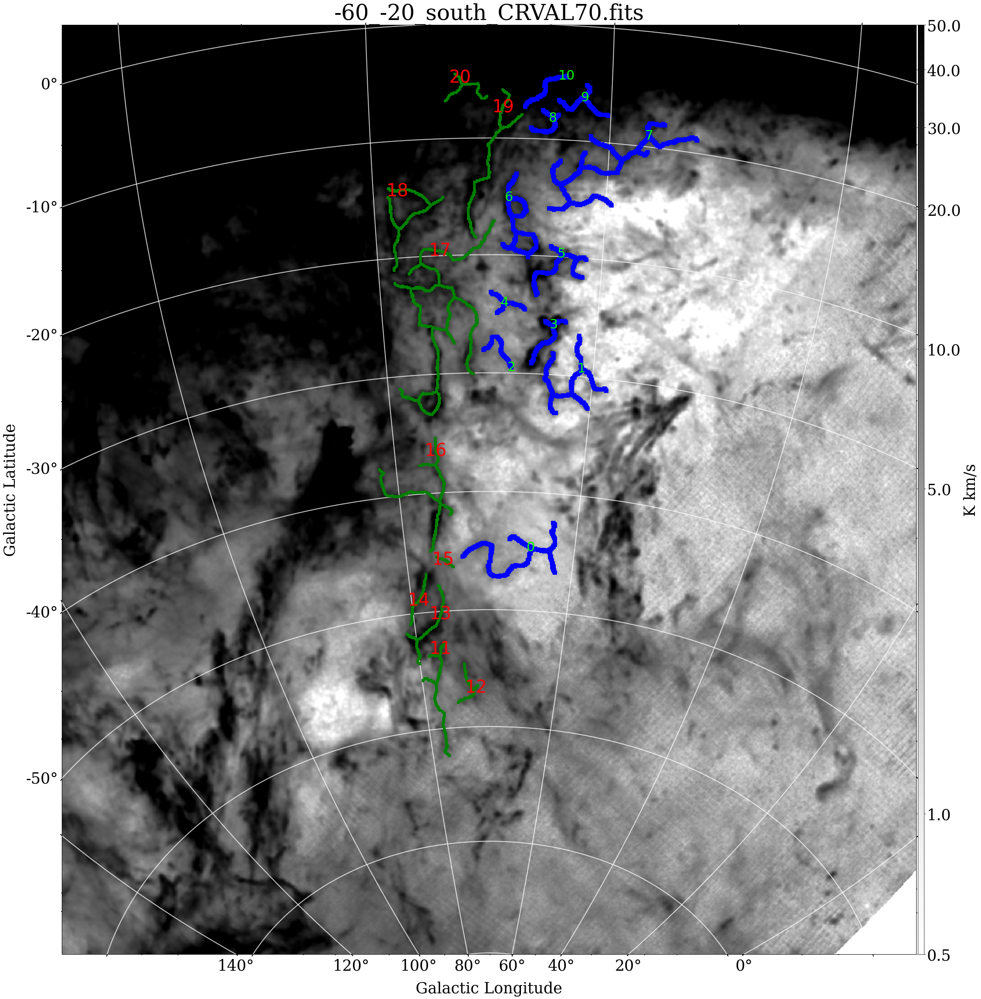

<Figure size 576x576 with 0 Axes>

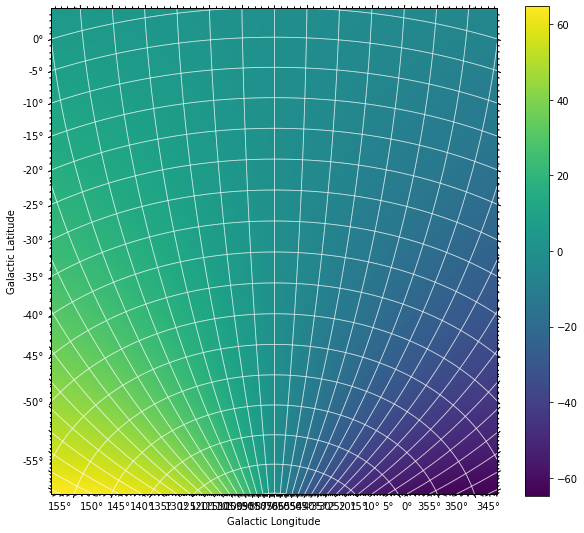

100%|███████████████████████████████████████████| 21/21 [00:01<00:00, 12.10it/s]


,T Kkm/s,M Msolar,orientation [deg],length [pix],width [pix]
filament 0,1.09e+04,3.35e+02,-43.03,192.31,9.21
filament 1,1.4e+04,4.3e+02,10.37,152.45,8.25
filament 2,9.64e+03,2.97e+02,10.40,76.14,15.78
filament 3,3.48e+04,1.07e+03,-35.28,69.01,10.71
filament 4,3.70e+03,1.14e+02,65.37,48.85,6.40
filament 5,3.31e+04,1.02e+03,-19.73,119.70,11.62
filament 6,4.24e+04,1.31e+03,4.96,118.93,8.60
filament 7,6.69e+04,2.06e+03,-72.40,265.88,10.32
filament 8,2.78e+04,8.56e+02,71.77,62.81,8.86
filament 9,5.10e+04,1.57e+03,65.66,75.97,8.71


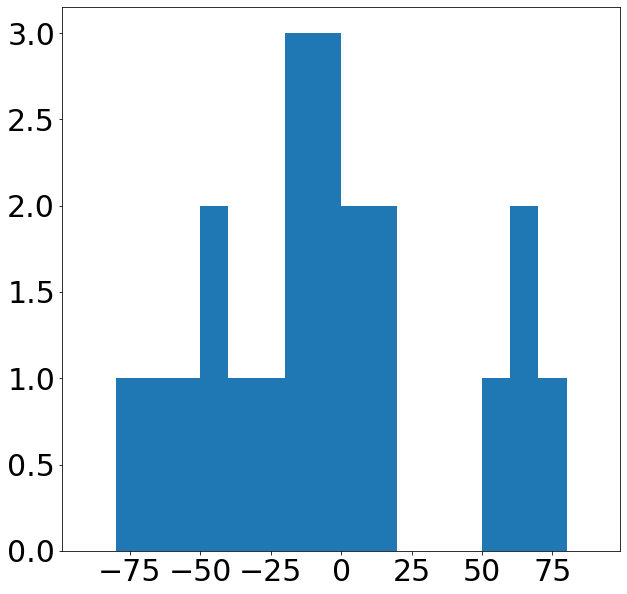

In [344]:
new_fil_right, new_fil_left = Catalog.fil_right, Catalog.fil_left

Catalog.fil_mapping(ii_hdu,fits_name=fits_name, fil_right_obj = fil_right, fil_left_obj = fil_left,key="prototype")

#全体 prototype
total_fil = Catalog.make_total_fil(fil_right_obj=new_fil_right, fil_left_obj=new_fil_left)

ori_dict = Catalog.make_PA(ii_hdu=ii_hdu, total_fil=total_fil, fits_name=fits_name)
Catalog.make_fil_table(total_fil=total_fil,key="prototype", fits_name=fits_name)

100%|███████████████████████████████████████████| 23/23 [00:01<00:00, 16.33it/s]


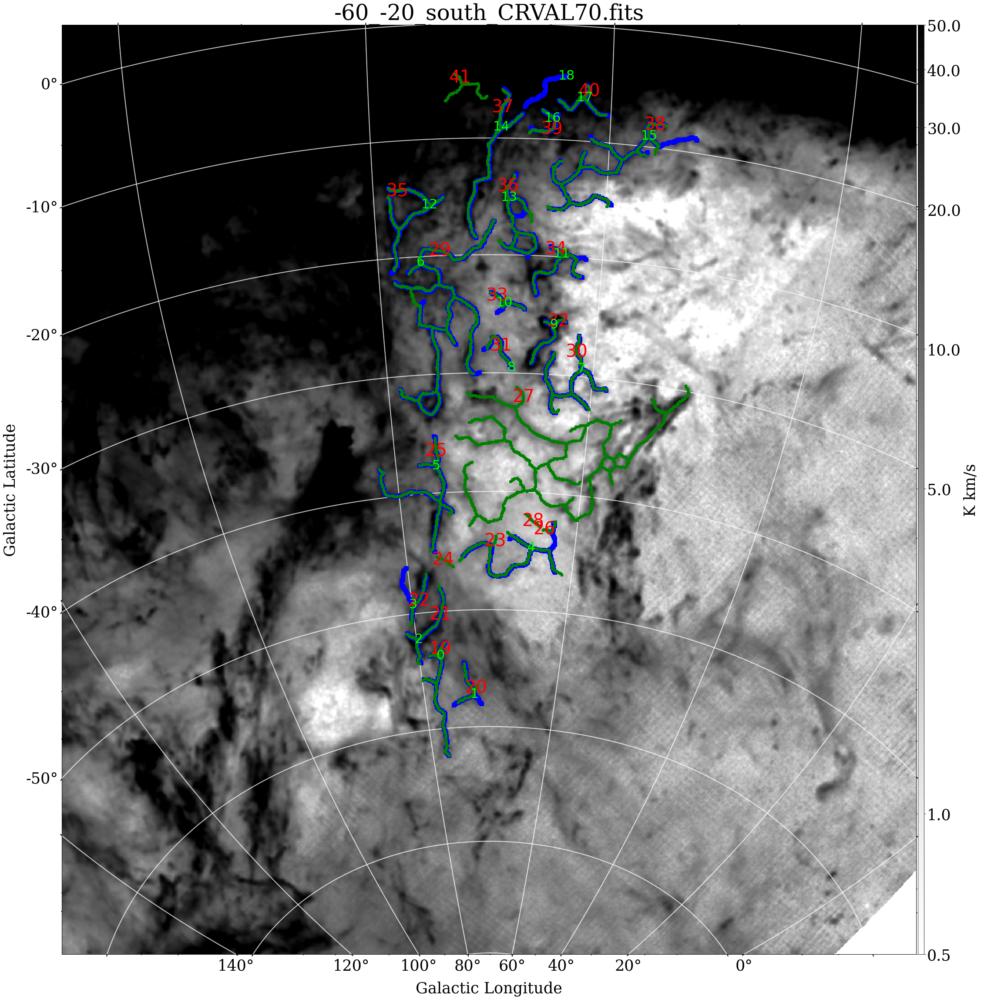

In [322]:
Catalog.fil_mapping(ii_hdu, fil_right_obj = fil_right_, fil_left_obj = fil_left_, key="overlap", fits_name=fits_name)

100%|███████████████████████████████████████████| 19/19 [00:01<00:00, 17.86it/s]


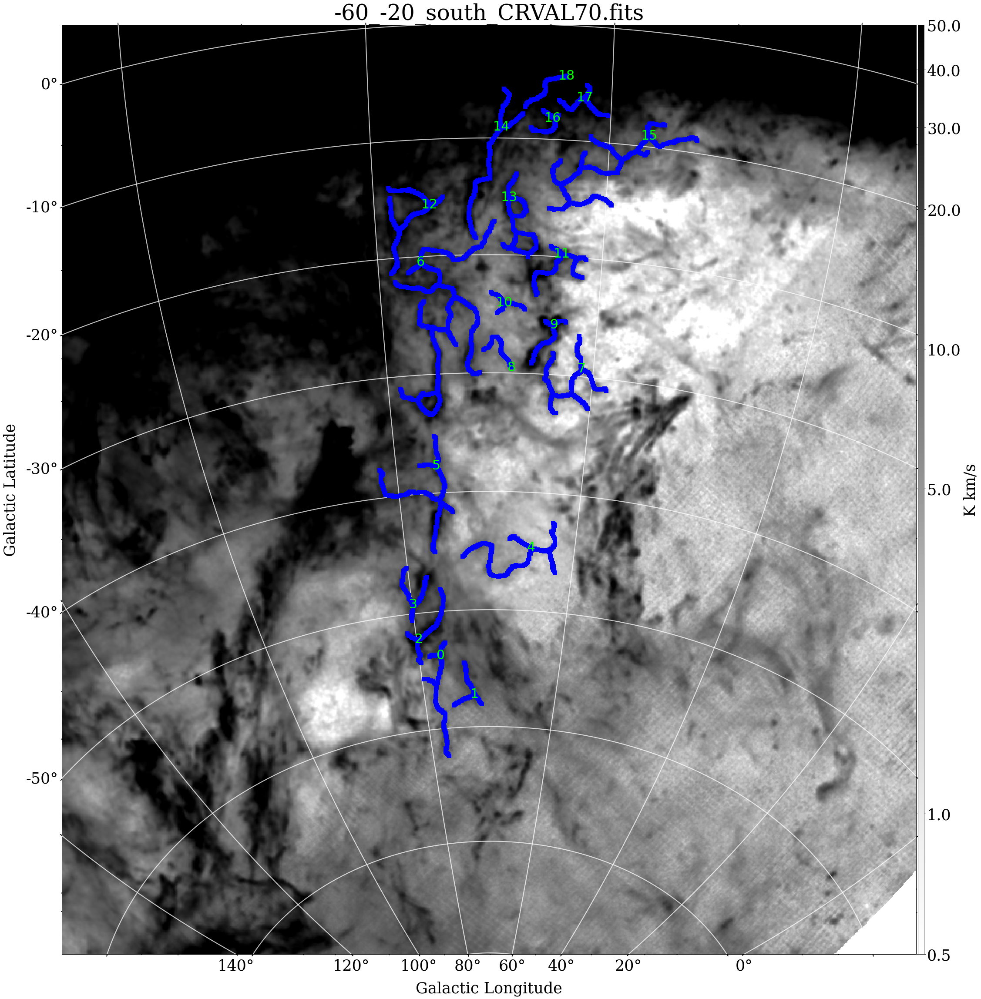

<Figure size 576x576 with 0 Axes>

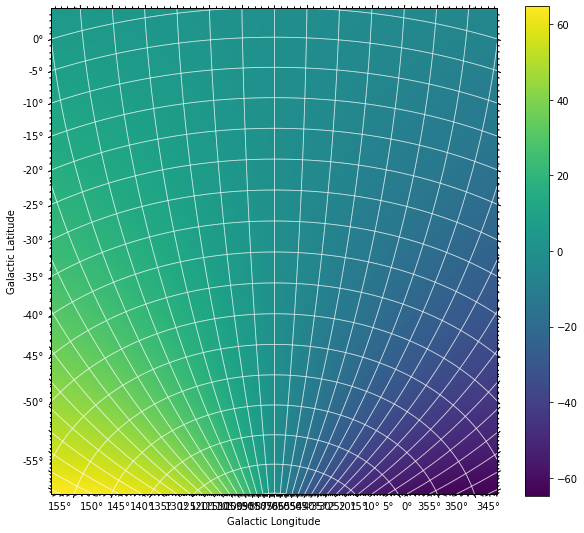

100%|███████████████████████████████████████████| 19/19 [00:01<00:00, 11.29it/s]


,T Kkm/s,M Msolar,orientation [deg],length [pix],width [pix]
filament 0,1.82e+04,5.59e+02,-5.43,138.66,8.58
filament 1,1.34e+04,4.12e+02,-4.48,73.19,11.42
filament 2,1.18e+04,3.63e+02,-27.01,78.84,3.66
filament 3,2.48e+04,7.63e+02,-12.38,91.58,11.32
filament 4,1.09e+04,3.35e+02,-43.03,192.31,9.21
filament 5,5.87e+04,1.81e+03,-4.71,141.76,10.68
filament 6,1.39e+05,4.26e+03,-7.97,350.91,9.10
filament 7,1.4e+04,4.3e+02,10.37,152.45,8.25
filament 8,9.64e+03,2.97e+02,10.40,76.14,15.78
filament 9,3.48e+04,1.07e+03,-35.28,69.01,10.71


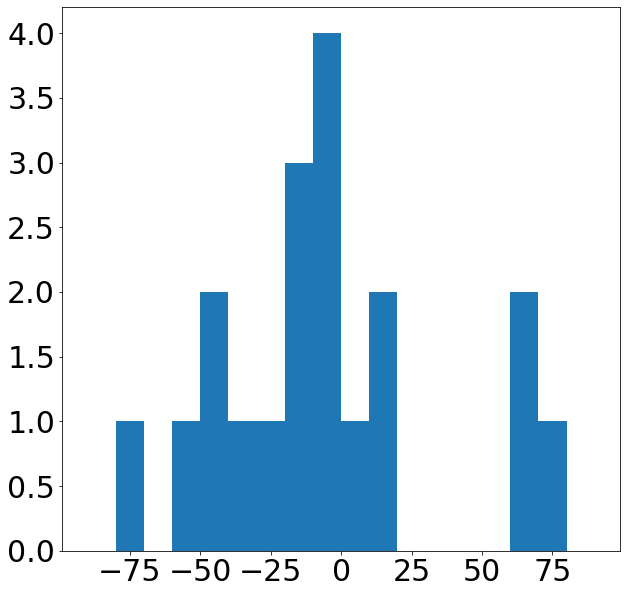

In [323]:
#右のみ

Catalog.fil_mapping(ii_hdu, fil_right_obj = fil_right_,key="right", fits_name=fits_name)

total_fil = Catalog.make_total_fil(fil_right_obj=Catalog.fil_right_)

ori_dict = Catalog.make_PA(ii_hdu=ii_hdu, total_fil=total_fil, fits_name=fits_name)
Catalog.make_fil_table(total_fil=total_fil,key="right", fits_name=fits_name)

100%|███████████████████████████████████████████| 23/23 [00:01<00:00, 16.46it/s]


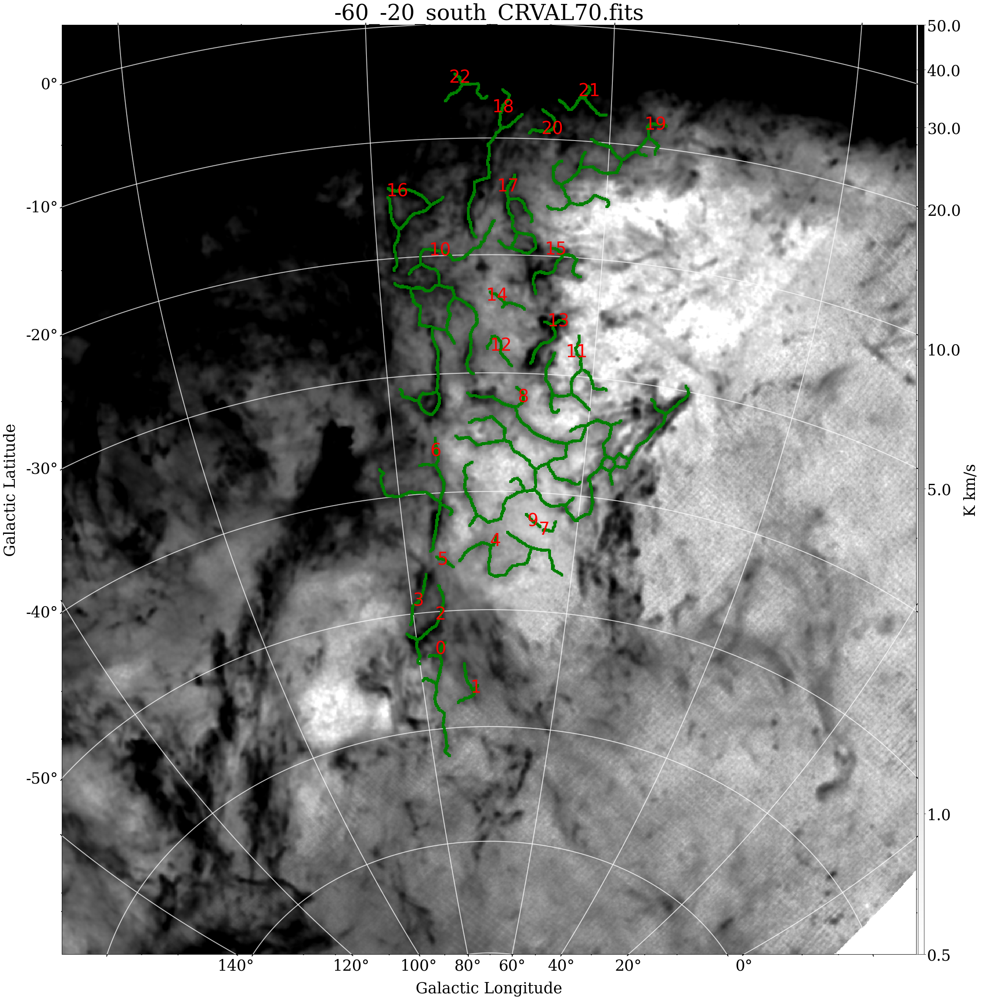

<Figure size 576x576 with 0 Axes>

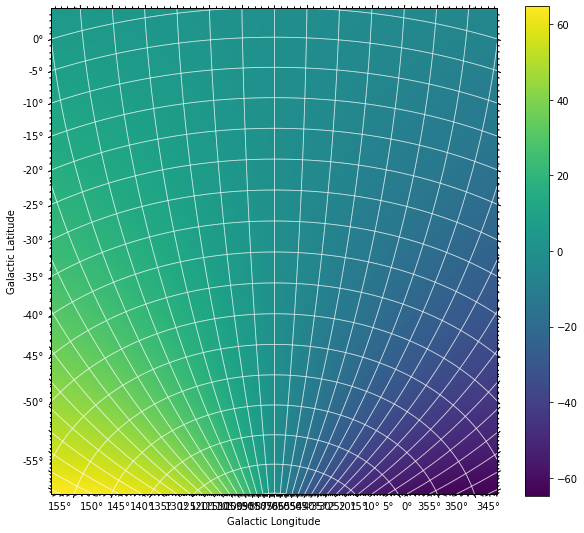

100%|███████████████████████████████████████████| 23/23 [00:02<00:00, 10.51it/s]


,T Kkm/s,M Msolar,orientation [deg],length [pix],width [pix]
filament 0,1.7e+04,5.23e+02,-5.66,139.28,8.13
filament 1,2.05e+04,6.29e+02,3.85,84.48,29.03
filament 2,2.21e+04,6.81e+02,-19.90,98.91,6.21
filament 3,1.78e+04,5.47e+02,-25.64,68.62,10.41
filament 4,2.06e+04,6.35e+02,-43.33,206.54,22.27
filament 5,1.44e+03,4.43e+01,55.50,26.18,5.03
filament 6,7.36e+04,2.26e+03,-6.87,144.85,14.70
filament 7,7.66e+02,2.36e+01,-50.87,31.51,10.61
filament 8,9.7e+04,2.98e+03,-26.34,449.57,10.01
filament 9,4.27e+02,1.32e+01,51.52,25.87,6.89


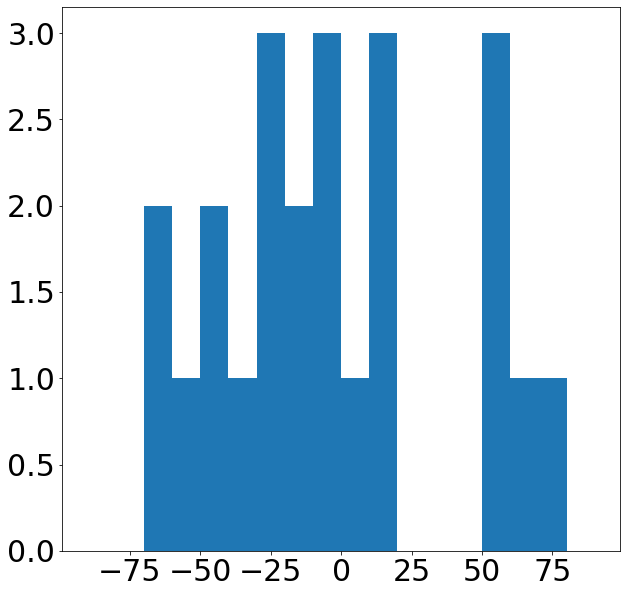

In [324]:
#左のみ

Catalog.fil_mapping(ii_hdu, fil_left_obj = fil_left_,key="left", fits_name=fits_name)
total_fil = Catalog.make_total_fil(fil_left_obj=Catalog.fil_left_)

ori_dict = Catalog.make_PA(ii_hdu=ii_hdu, total_fil=total_fil, fits_name=fits_name)
Catalog.make_fil_table(total_fil=total_fil,key="left", fits_name=fits_name)

filamentの選定

In [235]:
type(new_fil_right)!=dict

True

100%|███████████████████████████████████████████| 10/10 [00:00<00:00, 17.68it/s]


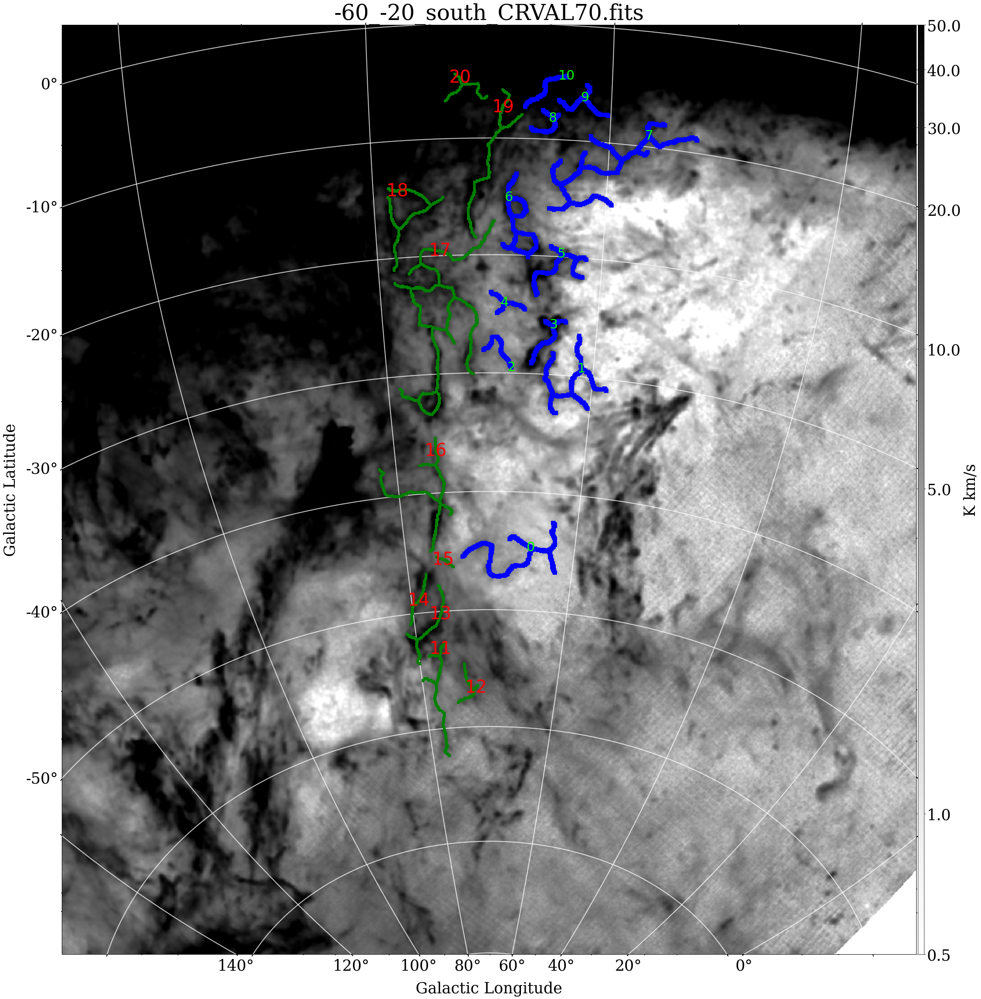

<Figure size 576x576 with 0 Axes>

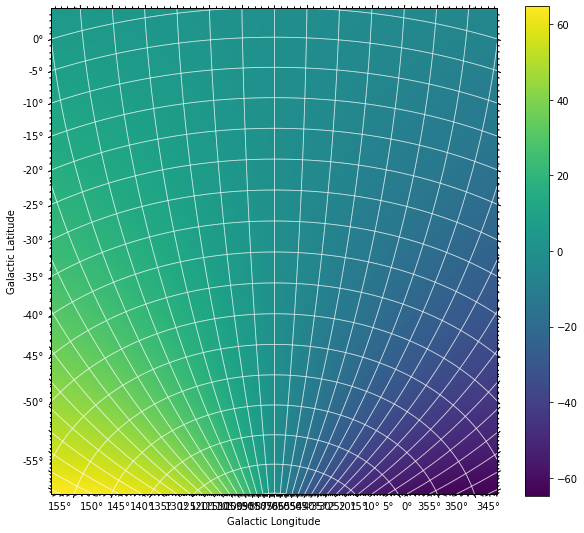

100%|███████████████████████████████████████████| 21/21 [00:01<00:00, 11.80it/s]


,T Kkm/s,M Msolar,orientation [deg],length [pix],width [pix]
filament 0,1.09e+04,3.35e+02,-43.03,192.31,9.21
filament 1,1.4e+04,4.3e+02,10.37,152.45,8.25
filament 2,9.64e+03,2.97e+02,10.40,76.14,15.78
filament 3,3.48e+04,1.07e+03,-35.28,69.01,10.71
filament 4,3.70e+03,1.14e+02,65.37,48.85,6.40
filament 5,3.31e+04,1.02e+03,-19.73,119.70,11.62
filament 6,4.24e+04,1.31e+03,4.96,118.93,8.60
filament 7,6.69e+04,2.06e+03,-72.40,265.88,10.32
filament 8,2.78e+04,8.56e+02,71.77,62.81,8.86
filament 9,5.10e+04,1.57e+03,65.66,75.97,8.71


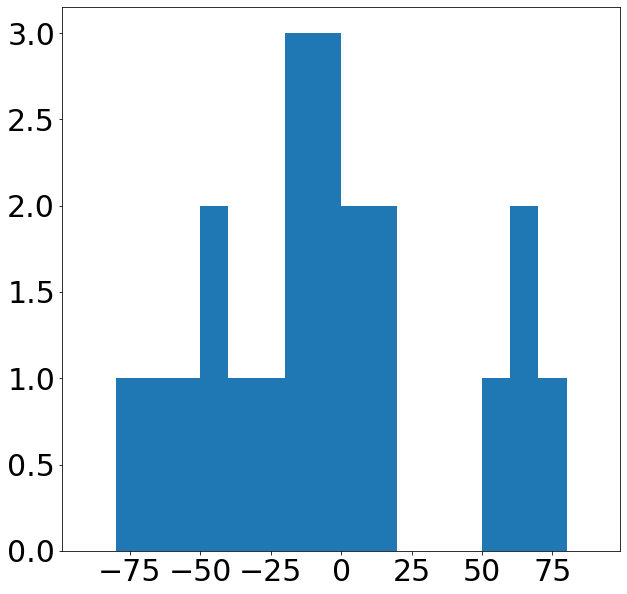

In [349]:
new_fil_right, new_fil_left = Catalog.fil_right, Catalog.fil_left

######### insert prototype catalog filament id in left_number
new_fil_right,new_fil_left = Catalog.del_filament(fil_right=fil_right, fil_left=fil_left, \
        right_number=[],left_number=[])

new_fil_right,new_fil_left = Catalog.add_filament(fil_right=new_fil_right, fil_left=new_fil_left, \
                        fil_right_=fil_right_, fil_left_=fil_left_,right_number=[],left_number=[])
Catalog.fil_mapping(ii_hdu, fil_right_obj = new_fil_right, fil_left_obj = new_fil_left,key="finished", fits_name=fits_name)

#全体
total_fil = Catalog.make_total_fil(fil_right_obj=new_fil_right, fil_left_obj=new_fil_left)

ori_dict = Catalog.make_PA(ii_hdu=ii_hdu, total_fil=total_fil,fits_name=fits_name)
Catalog.make_fil_table(total_fil=total_fil,key="finished", fits_name=fits_name)

Catalog.save_object(fil_right_obj=new_fil_right, fil_left_obj=new_fil_left, total_fil_obj=total_fil, fits_name=fits_name)


In [155]:
index=10

-54.03 deg


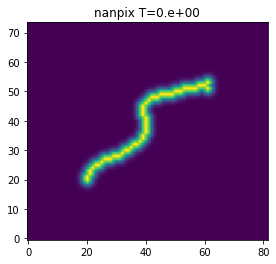

In [156]:
plt.imshow(total_fil[index].model_image(),origin="lower")
plt.title("%spix T=%s"%(np.round(total_fil[index].radprof_fwhm()[0].value,2),\
          np.format_float_scientific(total_fil[index].total_intensity().value,precision=2,exp_digits=2)))
print(np.round(ori_dict[Catalog.fits_name][index],2),"deg")

In [233]:
type(total_fil) == list

True

70

In [406]:
st_point = 20
with open("/home/filament/Documents/fil_object/fil_right/fil_right_-60_-20_south_CRVAL%s.fits.pkl"%(st_point-10), "rb") as ff:
    right_fil_right = pickle.load(ff)
with open("/home/filament/Documents/wcs/wcs_-60_-20_south_CRVAL%s.fits.pkl"%(st_point-15), "rb") as ff:
    right_w_right = pickle.load(ff)

with open("/home/filament/Documents/fil_object/fil_left/fil_left_-60_-20_south_CRVAL%s.fits.pkl"%(st_point-10), "rb") as ff:
    right_fil_left = pickle.load(ff)   
with open("/home/filament/Documents/wcs/wcs_-60_-20_south_CRVAL%s.fits.pkl"%(st_point-5), "rb") as ff:
    right_w_left = pickle.load(ff) 
    
    

    
with open("/home/filament/Documents/fil_object/fil_right/fil_right_-60_-20_south_CRVAL%s.fits.pkl"%(st_point+10), "rb") as ff:
    left_fil_right = pickle.load(ff)
with open("/home/filament/Documents/wcs/wcs_-60_-20_south_CRVAL%s.fits.pkl"%(st_point+5), "rb") as ff:
    left_w_right = pickle.load(ff)

with open("/home/filament/Documents/fil_object/fil_left/fil_left_-60_-20_south_CRVAL%s.fits.pkl"%(st_point+10), "rb") as ff:
    left_fil_left = pickle.load(ff)   
with open("/home/filament/Documents/wcs/wcs_-60_-20_south_CRVAL%s.fits.pkl"%(st_point+15), "rb") as ff:
    left_w_left = pickle.load(ff) 
    
fpath = "/home/filament/Documents/size_decision/fits/-60_-20_south_CRVAL%s.fits"%(st_point)   
ii_hdu_ = fits.open(fpath)[0]
fits_name_ = fpath.split("/")[6]

In [407]:
fits_name_

'-60_-20_south_CRVAL20.fits'

In [408]:
right_total_fil = Catalog.make_total_fil(fil_right_obj=right_fil_right, fil_left_obj=right_fil_left,\
                                  w_right=right_w_right,w_left=right_w_left)
left_total_fil = Catalog.make_total_fil(fil_right_obj=left_fil_right, fil_left_obj=left_fil_left,\
                                       w_right=left_w_right, w_left=left_w_left)

In [409]:
len(right_total_fil["fil_object"]),len(right_total_fil["wcs"])

(30, 30)

In [410]:
len(left_total_fil["fil_object"]),len(left_total_fil["wcs"])

(19, 19)

100%|███████████████████████████████████████████| 19/19 [00:02<00:00,  8.51it/s]


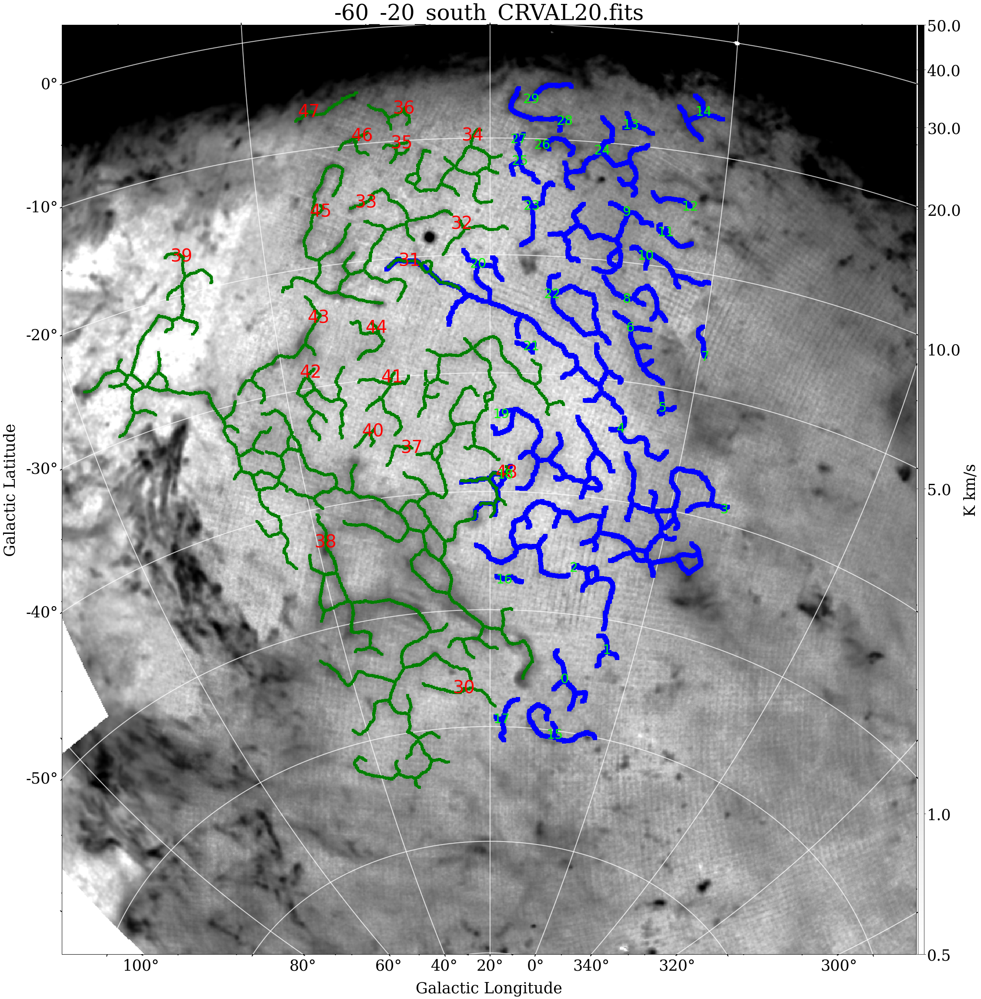

In [383]:
Catalog.fil_mapping(ii_hdu = ii_hdu_, fil_right_obj = right_total_fil, fil_left_obj = left_total_fil,\
                   fits_name=fits_name_)

#全体
# total_fil = Catalog.make_total_fil(fil_right_obj=right_total_fil, fil_left_obj=left_total_fil,\
#                                   w_right=Catalog.w_right,w_left=Catalog.w_left)

# ori_dict = Catalog.make_PA(ii_hdu=ii_hdu, total_fil=load_total_fil,fits_name=fits_name_)
# Catalog.make_fil_table(total_fil=load_total_fil)

100%|███████████████████████████████████████████| 18/18 [00:02<00:00,  8.26it/s]


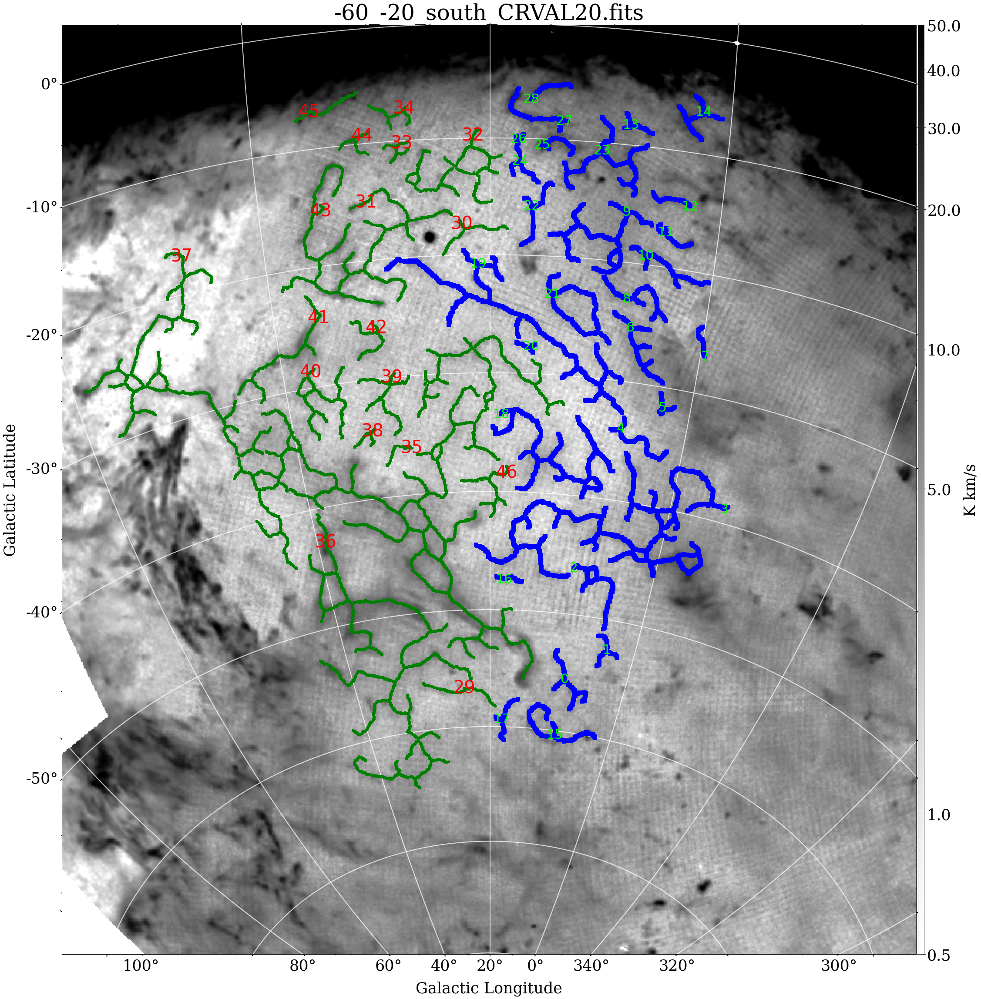

<Figure size 576x576 with 0 Axes>

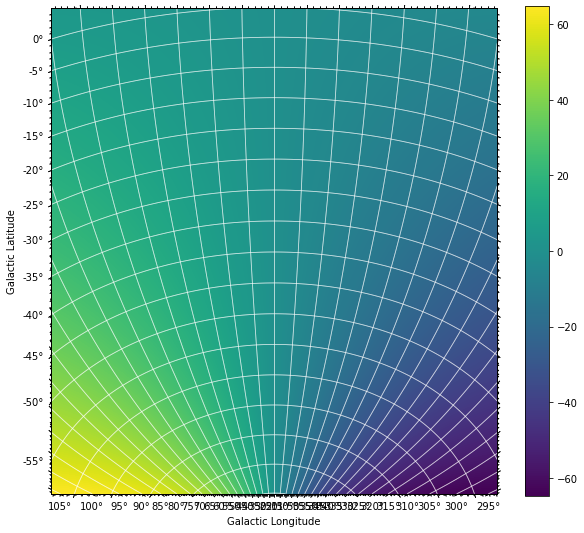

100%|███████████████████████████████████████████| 47/47 [00:05<00:00,  8.81it/s]


,T Kkm/s,M Msolar,orientation [deg],length [pix],width [pix]
filament 0,4.4e+03,1.35e+02,22.32,83.01,10.00
filament 1,3.55e+03,1.09e+02,0.61,59.50,16.88
filament 2,3.16e+03,9.72e+01,9.57,113.45,6.37
filament 3,4.16e+04,1.28e+03,80.43,531.59,8.31
filament 4,1.97e+03,6.08e+01,54.35,101.29,6.31
filament 5,1.79e+03,5.51e+01,36.34,38.63,7.66
filament 6,1.07e+04,3.28e+02,41.43,97.98,13.36
filament 7,1.67e+03,5.14e+01,19.15,43.52,7.31
filament 8,7.58e+03,2.33e+02,42.71,119.30,12.42
filament 9,1.22e+04,3.76e+02,61.85,163.51,7.89


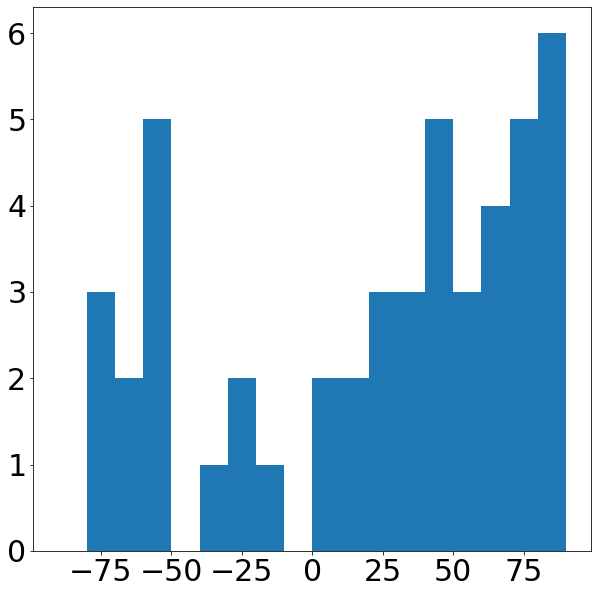

In [411]:
new_fil_right,new_fil_left = Catalog.del_filament(fil_right=right_total_fil, fil_left=left_total_fil, \
        right_number=[18],left_number=[31])
Catalog.fil_mapping(ii_hdu = ii_hdu_, fil_right_obj = new_fil_right, fil_left_obj = new_fil_left,\
                   fits_name=fits_name_)

total_fil = Catalog.make_total_fil(fil_right_obj=new_fil_right, fil_left_obj=new_fil_left)
ori_dict = Catalog.make_PA(ii_hdu=ii_hdu_, total_fil=total_fil["fil_object"],fits_name=fits_name_)
Catalog.make_fil_table(total_fil=total_fil,fits_name=fits_name_)

71.75 deg


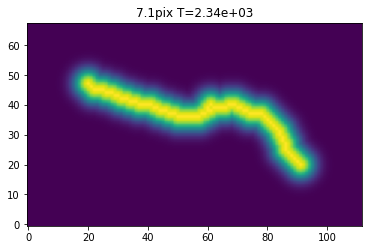

In [414]:
index = 29
plt.imshow(total_fil["fil_object"][index].model_image(),origin="lower")
plt.title("%spix T=%s"%(np.round(total_fil["fil_object"][index].radprof_fwhm()[0].value,2),\
          np.format_float_scientific(total_fil["fil_object"][index].total_intensity().value,precision=2,exp_digits=2)))
print(np.round(ori_dict[fits_name_][index],2),"deg")

In [395]:
len(total_fil["fil_object"]),len(total_fil["wcs"])

(47, 47)

In [290]:
total_fil_ = {}
total_fil_["fil_object"] = []
total_fil_["wcs"] = []
total_fil_["fil_object"] += right_total_fil["fil_object"]
total_fil_["fil_object"] += left_total_fil["fil_object"]
total_fil_["wcs"] += right_total_fil["wcs"]
total_fil_["wcs"] += left_total_fil["wcs"]


In [294]:
len(total_fil_["fil_object"]),len(total_fil_["wcs"])

(49, 49)

100%|███████████████████████████████████████████| 49/49 [00:03<00:00, 12.79it/s]


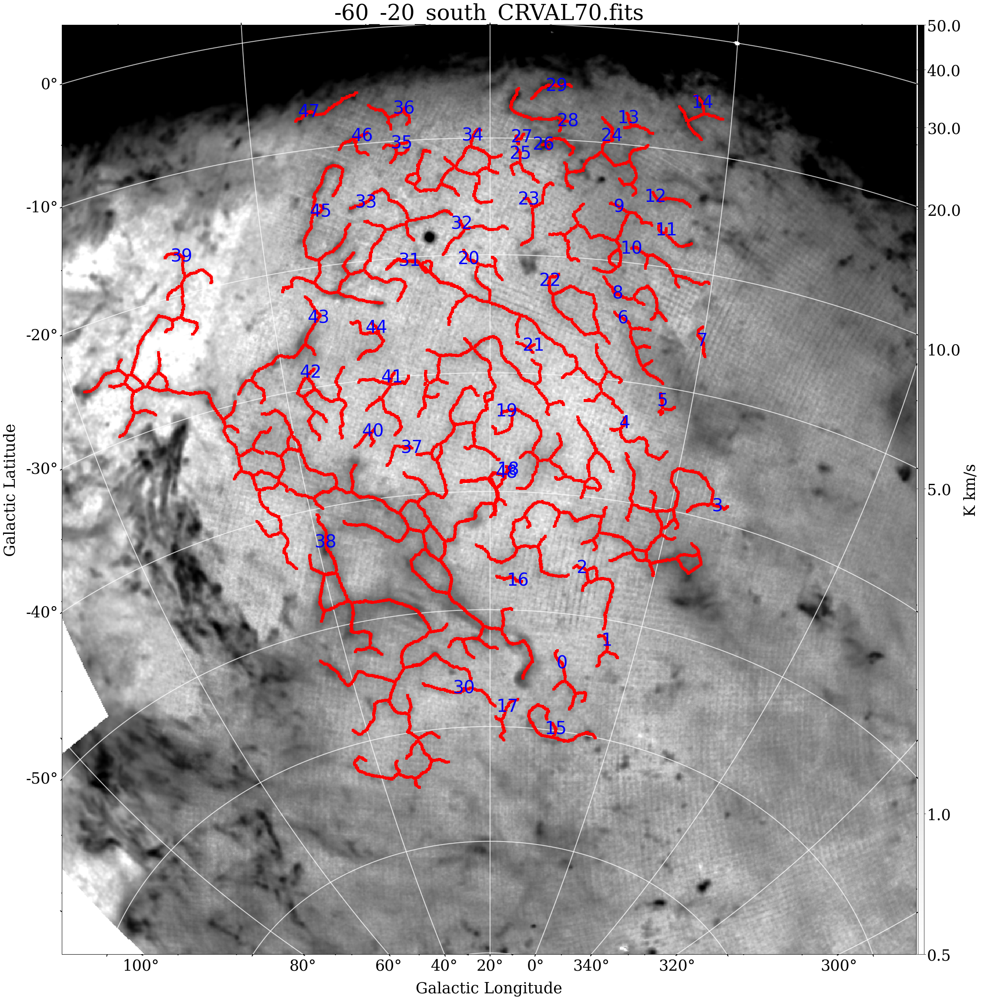

<Figure size 576x576 with 0 Axes>

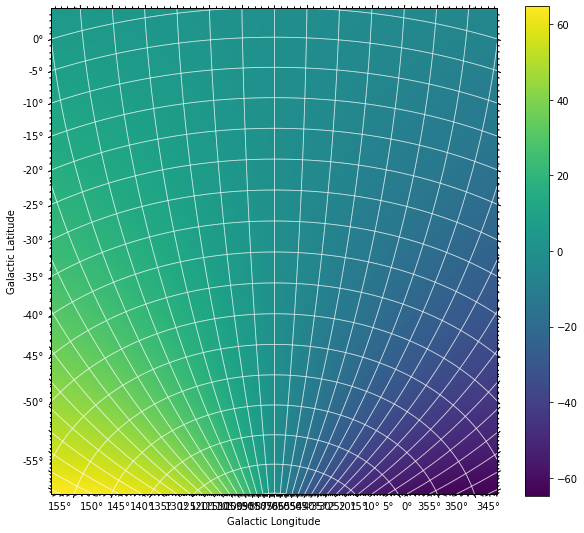

100%|███████████████████████████████████████████| 49/49 [00:05<00:00,  8.93it/s]


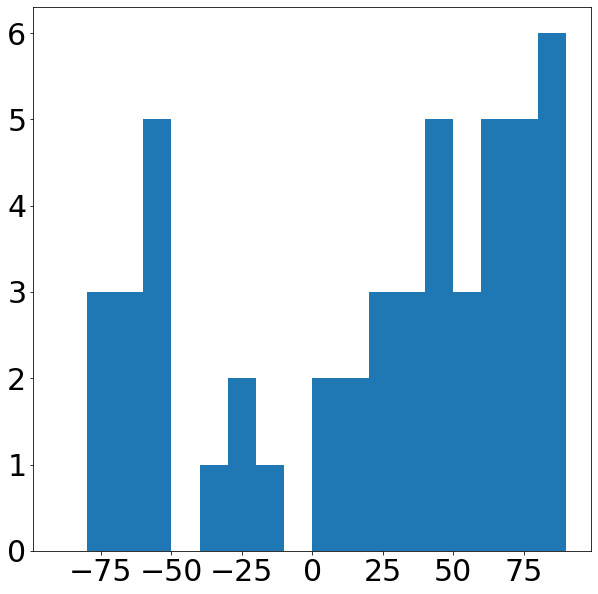

In [304]:

new_fil_right,new_fil_left = Catalog.del_filament(fil_right=fil_right, fil_left=fil_left, \
        right_number=[],left_number=[])
Catalog.fil_mapping(ii_hdu_, total_fil_obj = total_fil_)

#全体
# total_fil = Catalog.make_total_fil(fil_right_obj=load_fil_right, fil_left_obj=load_fil_left)

ori_dict = Catalog.make_PA(ii_hdu=ii_hdu, total_fil=total_fil_["fil_object"])
df = Catalog.make_fil_table(total_fil=total_fil_["fil_object"])

57.6 deg


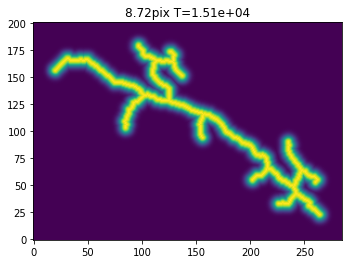

In [310]:
index = 20
plt.imshow(total_fil_["fil_object"][index].model_image(),origin="lower")
plt.title("%spix T=%s"%(np.round(total_fil_["fil_object"][index].radprof_fwhm()[0].value,2),\
          np.format_float_scientific(total_fil_["fil_object"][index].total_intensity().value,precision=2,exp_digits=2)))
print(np.round(ori_dict[Catalog.fits_name][index],2),"deg")

In [306]:
Catalog.fil_mapping(ii_hdu = ii_hdu_, total_fil_obj=left_total_fil,fits_name=fits_name_)

{'-60_-20_south_CRVAL70.fits': array([ 22.31768324,   0.61402434,   9.57469682,  80.42717682,
         54.35117836,  36.34051957,  41.42988606,  19.15083244,
         42.71464226,  61.8528849 ,  71.69695807,  68.01656468,
         81.33790204,  58.94681819,  28.68585809,  78.12183385,
         78.81222064, -17.55077958, -62.86477094,  40.87351671,
         57.59546786,  81.01328293,  46.56325748, -20.13800002,
        -70.34351621,  32.79327963,  89.95562101, -58.72766666,
         82.24100368, -71.34264497,  71.75253212,  67.95310726,
        -70.38229359, -61.75653538, -54.33423086,  72.69258026,
         68.70248199, -54.87548112,  35.61497769,  23.66009575,
        -38.34383324,  45.27057756,  15.43554039, -53.86320804,
         84.48410169, -23.87304249,  67.86494295, -69.43772396,
        -58.7428757 ])}

In [ ]:
w = WCS(ii_hdu)

fig = plt.figure(figsize=(32, 32))
f = aplpy.FITSFigure(ii_hdu, slices=[0], figure=fig)
f.show_colorscale(vmin = 0.5, vmax = 50, stretch="log", cmap="Greys")
f.add_colorbar()
f.colorbar.show()
f.colorbar.set_width(0.2)
f.colorbar.set_ticks([0.5, 1, 5, 10, 20, 30, 40, 50])
f.colorbar.set_font(size=35, family='serif')
f.colorbar.set_axis_label_text("K km/s")
f.colorbar.set_axis_label_font(size=35, family='serif')

cmap = plt.get_cmap("gist_rainbow")
#         d = copy.deepcopy(data0)
pos_x_wcs_list = []
pos_y_wcs_list = []
color_tempo_list = []
y_start0_list = []
x_start0_list = []

if fil_right_obj and (type(fil_right_obj)!=dict):
#fil_right
    pos_x_wcs_list_right = []
    pos_y_wcs_list_right = []
    for fil_tempo in tqdm.tqdm(fil_right_obj.filaments):
        w = self.w_right
        if w_right:
            w = w_right
        y_start, x_start = fil_tempo.pixel_extents[0][0], fil_tempo.pixel_extents[0][1]
        fil_tempo.rht_branch_analysis()
        ori_branches_tempo = np.rad2deg(fil_tempo.orientation_branches.value)
        for i in range(len(fil_tempo.branch_pts())):
            pixels_tempo = fil_tempo.branch_properties["pixels"][i]
            y_pix_all = pixels_tempo[:,0]
            x_pix_all = pixels_tempo[:,1]
            pos_x_tempo = int(np.nanmax(x_pix_all)/2-np.nanmin(x_pix_all)/2)+np.nanmin(x_pix_all)+x_start
            pos_y_tempo = int(np.nanmax(y_pix_all)/2-np.nanmin(y_pix_all)/2)+np.nanmin(y_pix_all)+y_start
            ori_branch_tempo = ori_branches_tempo[i]
            pos_x_wcs_tempo, pos_y_wcs_tempo = w.wcs_pix2world(pos_x_tempo, pos_y_tempo, 0)
            pos_x_wcs_array, pos_y_wcs_array = w.wcs_pix2world(x_pix_all+x_start, y_pix_all+y_start, 0)
            color_tempo_list += ["#%06x" % random.randint(0, 0xFFFFFF)]*len(pos_x_wcs_array)
            pos_x_wcs_list_right += list(pos_x_wcs_array)
            pos_y_wcs_list_right += list(pos_y_wcs_array)
    #         f.show_markers(pos_x_wcs_list, pos_y_wcs_list, marker="s", s=3, facecolor=color_tempo_list, edgecolor="none", zorder=11)

        y_start0_list.append(pos_y_wcs_array[0])
        x_start0_list.append(pos_x_wcs_array[0])
    f.show_markers(pos_x_wcs_list_right, pos_y_wcs_list_right, marker="s", s=100, facecolor="blue",edgecolor="none", zorder=11)

